In [82]:
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torchvision
import numpy as np
from typing import List
import os
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision.io import read_image
from torchvision import transforms
from torch.utils.data import random_split
from torchvision.transforms.functional import to_pil_image
from torchvision import transforms, utils
import torch.optim as optim
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score
import torch.nn.functional as F
from tqdm import tqdm
from torchvision import models

from utils import *

# Model Training

## Load the Data

In [2]:
# Define transform to reshape image to 256x256 and normalise to ImageNet standards
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std = [0.229, 0.224, 0.225]
        )
    ])

In [3]:
img_dir = 'data/all_frames'

# Define datasets for train/val/test
train_dataset = WarDataset(img_dir, 'data/train_labels.csv', transform=transform)
val_dataset = WarDataset(img_dir, 'data/val_labels.csv', transform=transform)
test_dataset = WarDataset(img_dir, 'data/test_labels.csv', transform=transform)

# Extract train labels from dataset object and calculate sample weights
train_label_list = []
for i in train_dataset:
    label = i[1]
    train_label_list.append(label)
    
train_labels = pd.DataFrame({'labels': train_label_list})
class_counts = train_labels['labels'].value_counts()
sample_weights = [1/class_counts[i] for i in train_labels['labels'].values]

In [4]:
# Create sampler for the train to fix class imbalance - note sample weights calculated above
sampler = WeightedRandomSampler(weights=sample_weights, num_samples = len(train_dataset), replacement=True)

# Create a DataLoader
train_loader = DataLoader(train_dataset, sampler = sampler, batch_size=32)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [ ]:
# Observe label distribution for train_loader
# visualise_dataloader(train_loader)

In [ ]:
# Observe label distribution for test_loader
# visualise_dataloader(test_loader)

## Training Loop

In [6]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
print(device)

mps


Train Loop without val and train losses

In [7]:
# Define a function to train the model
def train_model(model, dataloader, criterion, optimizer, num_epochs=10, patience=3):
    best_loss = float('inf')
    patience_counter= 0

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        loop = tqdm(dataloader, desc=f'Epoch {epoch+1}/{num_epochs}', unit='batch')
        for inputs, labels in loop:
            # If we use Sigmoid we should cast to float the labels and add a dimension
            inputs, labels = inputs.to(device), labels.to(device).float().unsqueeze(1) 
            # If we use Softmax we should use tensors
            # inputs, labels = inputs.to(device), torch.tensor(labels).to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            # Print statistics
            running_loss += loss.item() * inputs.size(0)
            loop.set_postfix(loss=loss.item())
        
        epoch_loss = running_loss / len(dataloader.dataset)
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}')
        
        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad(): # Disable gradient calculation
            for inputs, labels in val_loader:
                # Sigmoid
                inputs, labels = inputs.to(device), labels.to(device).float().unsqueeze(1) 
                # Softmax
                # inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item()*inputs.size(0)
                
        val_loss /= len(val_loader.dataset)
        print(f'Validation Loss: {val_loss:.4f}')
        
        # Check for early stopping
        if val_loss < best_loss:
            best_loss = val_loss
            patience_counter = 0
            if not os.path.isdir('./model_weights'):
                os.makedirs('model_weights')
            torch.save(model.state_dict(), 'model_weights/ResNet_best_model_training.pth')
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print('Early stopping')
                model.load_state_dict(torch.load('model_weights/ResNet_best_model_training.pth'))
                return model
    
    print('\nTraining complete!')
    model.load_state_dict(torch.load('model_weights/ResNet_best_model_training.pth'))  # Load the best model at the end
    
    return model

Train loop with val and train losses

In [12]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3):
    best_loss = float('inf')
    patience_counter = 0
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        loop = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}', unit='batch')
        for inputs, labels in loop:
            # If we use Sigmoid we should cast to float the labels and add a dimension
            inputs, labels = inputs.to(device), labels.to(device).float().unsqueeze(1)
            # If we use Softmax we should use tensors
            # inputs, labels = inputs.to(device), torch.tensor(labels).to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            # Print statistics
            running_loss += loss.item() * inputs.size(0)
            loop.set_postfix(loss=loss.item())
        
        epoch_loss = running_loss / len(train_loader.dataset)
        train_losses.append(epoch_loss)
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}')
        
        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad(): # Disable gradient calculation
            for inputs, labels in val_loader:
                # Sigmoid
                inputs, labels = inputs.to(device), labels.to(device).float().unsqueeze(1)
                # Softmax
                # inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                
        val_loss /= len(val_loader.dataset)
        val_losses.append(val_loss)
        print(f'Validation Loss: {val_loss:.4f}')
        
        # Check for early stopping
        if val_loss < best_loss:
            best_loss = val_loss
            patience_counter = 0
            if not os.path.isdir('./model_weights'):
                os.makedirs('model_weights')
            torch.save(model.state_dict(), 'model_weights/ResNet_best_model_training.pth')
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print('Early stopping')
                model.load_state_dict(torch.load('model_weights/ResNet_best_model_training.pth'))
                return model, train_losses, val_losses
    
    print('\nTraining complete!')
    model.load_state_dict(torch.load('model_weights/ResNet_best_model_training.pth'))  # Load the best model at the end
    
    return model, train_losses, val_losses

## ResNet 50 - Base Model

In [11]:
resnet50 = torchvision.models.resnet50(weights=("pretrained", models.ResNet50_Weights.IMAGENET1K_V1))

# Freeze all the parameters
for param in resnet50.parameters():
    param.requires_grad = False

# Replace the final fully connected layer
num_ftrs = resnet50.fc.in_features
resnet50.fc = torch.nn.Linear(num_ftrs, 1)

# Move the model to the GPU if available
resnet50 = resnet50.to(device)

# Define the loss function and optimizer
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = optim.Adam(resnet50.fc.parameters(), lr=0.001)

print(resnet50)

/Users/user/anaconda3/envs/torch-nightly/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [13]:
# Train the model
# trained_model = train_model(resnet50, train_loader, criterion, optimizer, num_epochs=10, patience=3)
trained_model, train_losses, val_losses = train_model(resnet50, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3)

Epoch 1/10: 100%|██████████| 227/227 [03:04<00:00,  1.23batch/s, loss=0.336]


Epoch [1/10], Loss: 0.3800
Validation Loss: 0.3793


Epoch 2/10: 100%|██████████| 227/227 [02:57<00:00,  1.28batch/s, loss=0.266]


Epoch [2/10], Loss: 0.3114
Validation Loss: 0.3162


Epoch 3/10: 100%|██████████| 227/227 [03:02<00:00,  1.24batch/s, loss=0.206]


Epoch [3/10], Loss: 0.3115
Validation Loss: 0.2817


Epoch 4/10: 100%|██████████| 227/227 [02:57<00:00,  1.28batch/s, loss=0.453]


Epoch [4/10], Loss: 0.2863
Validation Loss: 0.2595


Epoch 5/10: 100%|██████████| 227/227 [02:58<00:00,  1.27batch/s, loss=0.198]


Epoch [5/10], Loss: 0.2926
Validation Loss: 0.3200


Epoch 6/10: 100%|██████████| 227/227 [03:01<00:00,  1.25batch/s, loss=0.287]


Epoch [6/10], Loss: 0.2805
Validation Loss: 0.3181


Epoch 7/10: 100%|██████████| 227/227 [03:04<00:00,  1.23batch/s, loss=0.337] 


Epoch [7/10], Loss: 0.2838
Validation Loss: 0.2719
Early stopping


### Loss Plot

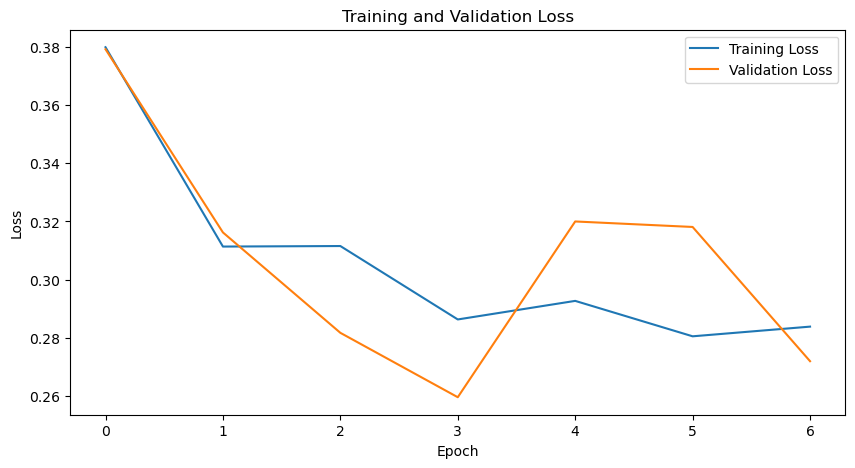

In [14]:
# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

### Model evaluation

Note images are not re-sized in the following function as there is no way to undo a stadard resizing.

In [15]:
test_images, test_labels, test_probs = evaluate_model_with_images(trained_model, test_loader, device=device)
val_images, val_labels, val_probs = evaluate_model_with_images(trained_model, val_loader, device=device)

Evaluating: 100%|██████████| 49/49 [00:37<00:00,  1.31batch/s]


Binary threshold selection based on maximisng F1 score

In [16]:
# Calculate the best threshold
best_threshold, best_f1 = find_best_threshold(val_labels, val_probs)
print(f"Best Threshold: {best_threshold}")
# Generate final predictions based on optimal threshold
test_preds = [1 if prob >= best_threshold else 0 for prob in test_probs]

Best Threshold: 0.56


In [17]:
metrics = Metrics()

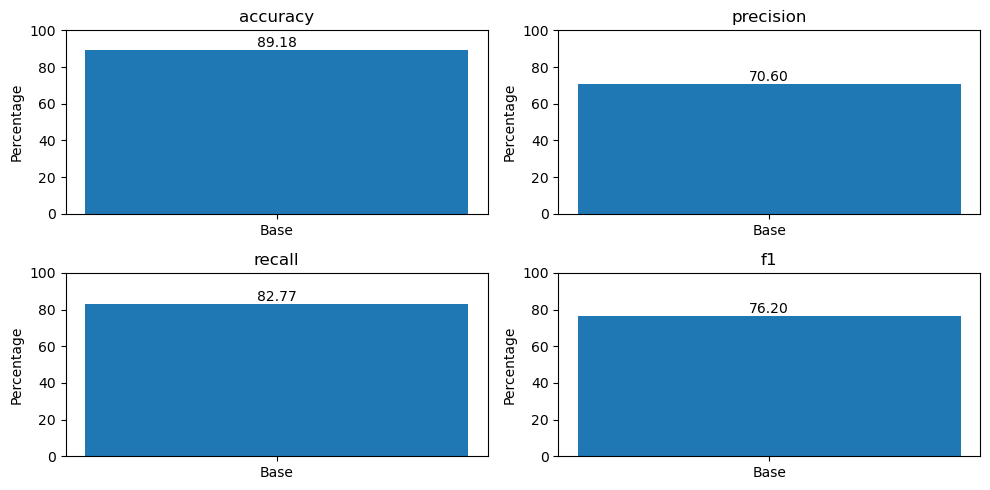

In [18]:
metrics.run(test_labels, test_preds, "Base")
metrics.plot()

Last plotted image index: 374


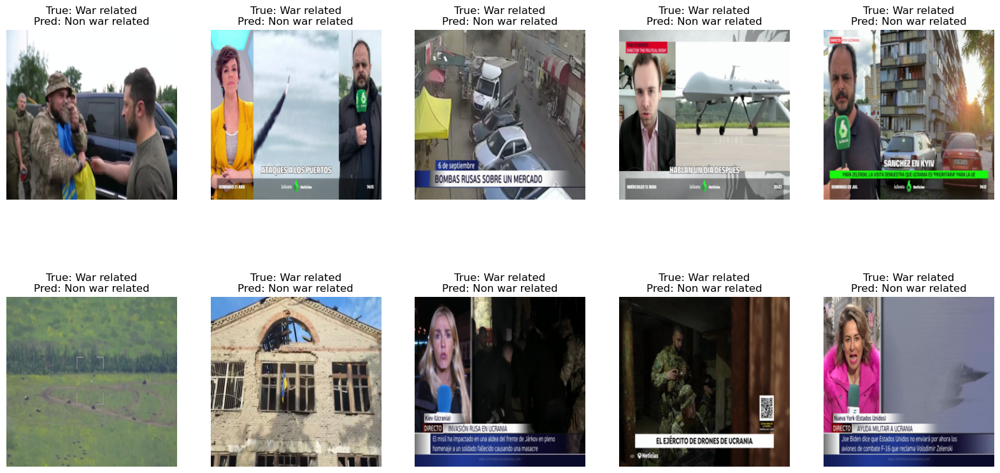

In [22]:
image_eval = EvaluateImages(test_images, test_labels, test_preds, test_probs)
image_eval.plot_false_negatives(0)

### Save model weights

In [23]:
# if not os.path.isdir('./model_weights/base_model'):
#     os.makedirs('./model_weights/base_model')
# # Save ResNet50 model weights
# torch.save(resnet50.state_dict(), 'model_weights/base_model/resnet50_base_model.pth')

## ResNet 50 - Custom Head

Adding a custom head to the pretrained model.

In [24]:
resnet50 = torchvision.models.resnet50(weights=("pretrained", models.ResNet50_Weights.IMAGENET1K_V1))

# Freeze all the parameters
for param in resnet50.parameters():
    param.requires_grad = False

# Replace the final fully connected layer
num_ftrs = resnet50.fc.in_features
# Define the custom head with two additional dense layers
resnet50.fc = torch.nn.Sequential(
    torch.nn.Linear(num_ftrs, 256),
    torch.nn.ReLU(),
    torch.nn.Linear(256, 128),
    torch.nn.ReLU(),
    torch.nn.Linear(128, 1)  # 2 output units for binary classification
)

# Move the model to the GPU if available
device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
resnet50 = resnet50.to(device)

# Define the loss function and optimizer
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = optim.Adam(resnet50.fc.parameters(), lr=0.001)

print(resnet50)

/Users/user/anaconda3/envs/torch-nightly/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [25]:
# Train the model
trained_model, train_losses, val_losses = train_model(resnet50, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3)

Epoch 1/10: 100%|██████████| 227/227 [02:56<00:00,  1.28batch/s, loss=0.51] 


Epoch [1/10], Loss: 0.3912
Validation Loss: 0.4219


Epoch 2/10: 100%|██████████| 227/227 [02:56<00:00,  1.29batch/s, loss=0.0734]


Epoch [2/10], Loss: 0.3135
Validation Loss: 0.2603


Epoch 3/10: 100%|██████████| 227/227 [02:55<00:00,  1.29batch/s, loss=0.788]


Epoch [3/10], Loss: 0.2923
Validation Loss: 0.2519


Epoch 4/10: 100%|██████████| 227/227 [02:57<00:00,  1.28batch/s, loss=0.153]


Epoch [4/10], Loss: 0.3034
Validation Loss: 0.3238


Epoch 5/10: 100%|██████████| 227/227 [02:51<00:00,  1.32batch/s, loss=0.149]


Epoch [5/10], Loss: 0.2761
Validation Loss: 0.3130


Epoch 6/10: 100%|██████████| 227/227 [02:59<00:00,  1.26batch/s, loss=0.258] 


Epoch [6/10], Loss: 0.2645
Validation Loss: 0.2633
Early stopping


### Loss Plot

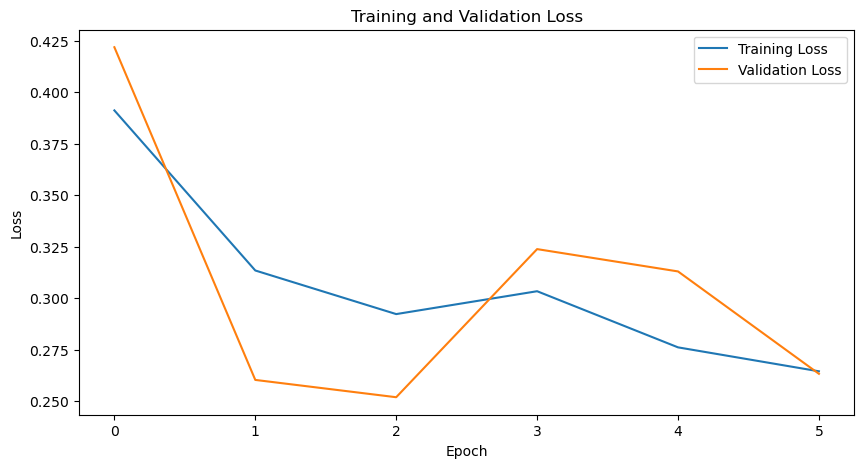

In [27]:
# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

We can see that the loss is having very large fluctuations in between epochs and is not really decreasing with the epochs, this is showing that the model is not learning. In future itrerations we will try to increase the complexity of the head to enable some learning.

In [26]:
test_images, test_labels, test_probs = evaluate_model_with_images(trained_model, test_loader, device=device)
val_images, val_labels, val_probs = evaluate_model_with_images(trained_model, val_loader, device=device)


Evaluating: 100%|██████████| 49/49 [00:39<00:00,  1.26batch/s]


In [28]:
# Calculate the best threshold
best_threshold, best_f1 = find_best_threshold(val_labels, val_probs)
print(f"Best Threshold: {best_threshold}")
# Generate final predictions based on optimal threshold
test_preds = [1 if prob >= best_threshold else 0 for prob in test_probs]

Best Threshold: 0.53


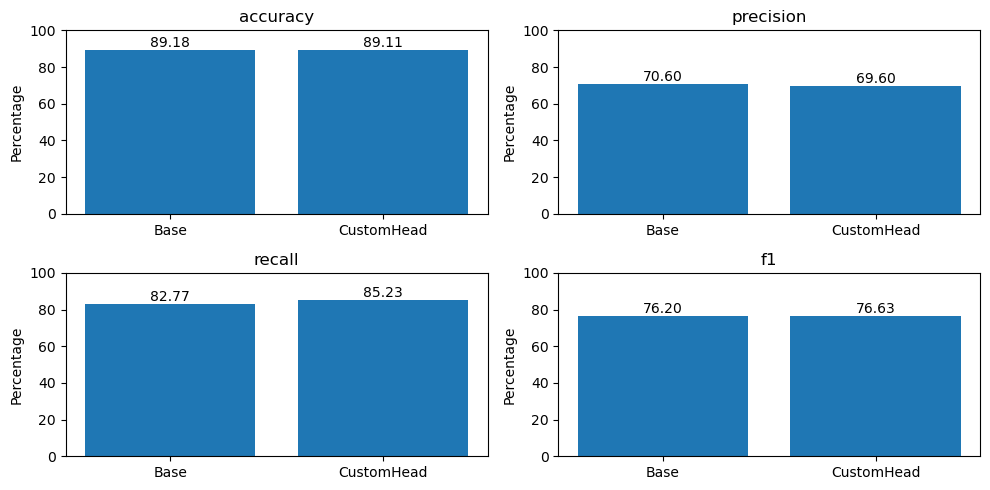

In [29]:
metrics.run(test_labels, test_preds, "CustomHead")
metrics.plot()

Last plotted image index: 9


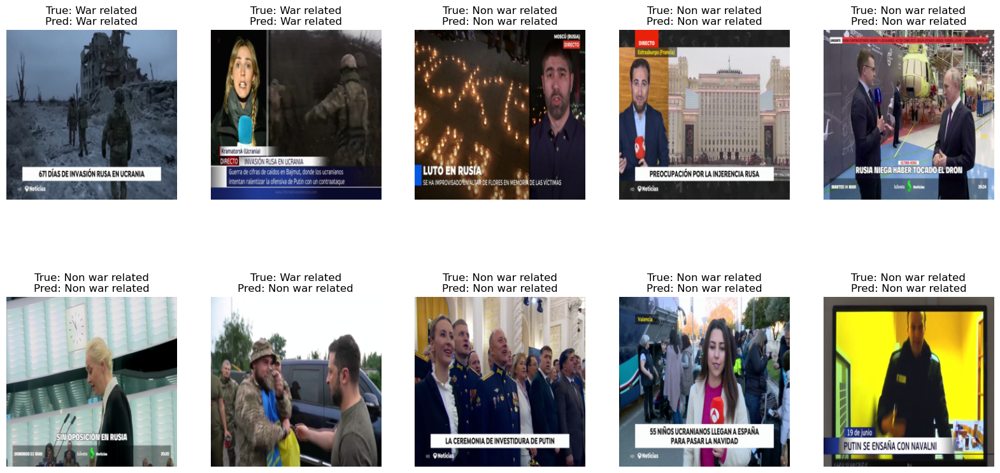

In [30]:
image_eval = EvaluateImages(test_images, test_labels, test_preds, test_probs)
image_eval.plot_images(0)

In [31]:
if not os.path.isdir('./model_weights/custom_head'):
    os.makedirs('./model_weights/custom_head')
# Save ResNet50 model weights
torch.save(resnet50.state_dict(), 'model_weights/custom_head/resnet50_custom_head.pth')

# Transfer Learning

In [38]:
# # Define a function to train the model
# def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3):
#     best_loss = float('inf')
#     patience_counter = 0

#     for epoch in range(num_epochs):
#         model.train()
#         running_loss = 0.0
#         loop = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}', unit='batch')
#         for inputs, labels in loop:
#             inputs, labels = inputs.to(device), labels.to(device).float().unsqueeze(1)

#             optimizer.zero_grad()
#             outputs = model(inputs)
#             loss = criterion(outputs, labels)
#             loss.backward()
#             optimizer.step()

#             running_loss += loss.item() * inputs.size(0)
#             loop.set_postfix(loss=loss.item())

#         epoch_loss = running_loss / len(train_loader.dataset)
#         print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}')

#         # Validation
#         model.eval()
#         val_loss = 0.0
#         with torch.no_grad():
#             for inputs, labels in val_loader:
#                 inputs, labels = inputs.to(device), labels.to(device).float().unsqueeze(1)
#                 outputs = model(inputs)
#                 loss = criterion(outputs, labels)
#                 val_loss += loss.item() * inputs.size(0)

#         val_loss /= len(val_loader.dataset)
#         print(f'Validation Loss: {val_loss:.4f}')

#         # Check for early stopping
#         if val_loss < best_loss:
#             best_loss = val_loss
#             patience_counter = 0
#             if not os.path.isdir('./model_weights'):
#                 os.makedirs('model_weights')
#             torch.save(model.state_dict(), 'model_weights/ResNet_best_model_training.pth')
#         else:
#             patience_counter += 1
#             if patience_counter >= patience:
#                 print('Early stopping')
#                 model.load_state_dict(torch.load('model_weights/ResNet_best_model_training.pth'))
#                 return model

#     print('\nTraining complete!')
#     model.load_state_dict(torch.load('model_weights/ResNet_best_model_training.pth'))
#     return model

## UnFreeze 1 layer

In [26]:
# # Create sampler for the train to fix class imbalance - note sample weights calculated above
# sampler = WeightedRandomSampler(weights=sample_weights, num_samples = len(train_dataset), replacement=True)

# # Create a DataLoader
# train_loader = DataLoader(train_dataset, sampler = sampler, batch_size=64)
# val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
# test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

In [32]:
resnet50 = torchvision.models.resnet50(weights=("pretrained", models.ResNet50_Weights.IMAGENET1K_V1))

# Freeze all the parameters
for param in resnet50.parameters():
    param.requires_grad = False

# Replace the final fully connected layer
num_ftrs = resnet50.fc.in_features
# Define the custom head with two additional dense layers
resnet50.fc = torch.nn.Sequential(
    torch.nn.Linear(num_ftrs, 512),
    torch.nn.ReLU(),
    # torch.nn.Dropout(0.5),  # Optional dropout for regularization
    torch.nn.Linear(512, 256),
    torch.nn.ReLU(),
    # torch.nn.Dropout(0.5),  # Optional dropout for regularization
    torch.nn.Linear(256, 1)
)

# Move the model to the GPU if available
device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
resnet50 = resnet50.to(device)

# Define the loss function and optimizer
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = optim.Adam(resnet50.fc.parameters(), lr=0.001)

print(resnet50)

/Users/user/anaconda3/envs/torch-nightly/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [33]:
# Train the model
trained_model, train_losses, val_losses = train_model(resnet50, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3)

Epoch 1/10: 100%|██████████| 227/227 [02:54<00:00,  1.30batch/s, loss=0.268]


Epoch [1/10], Loss: 0.3913
Validation Loss: 0.3802


Epoch 2/10: 100%|██████████| 227/227 [02:57<00:00,  1.28batch/s, loss=0.68]  


Epoch [2/10], Loss: 0.3232
Validation Loss: 0.2576


Epoch 3/10: 100%|██████████| 227/227 [02:55<00:00,  1.29batch/s, loss=0.746] 


Epoch [3/10], Loss: 0.2971
Validation Loss: 0.2737


Epoch 4/10: 100%|██████████| 227/227 [02:56<00:00,  1.29batch/s, loss=0.11]  


Epoch [4/10], Loss: 0.3004
Validation Loss: 0.2528


Epoch 5/10: 100%|██████████| 227/227 [03:09<00:00,  1.20batch/s, loss=0.0413]


Epoch [5/10], Loss: 0.2816
Validation Loss: 0.3501


Epoch 6/10: 100%|██████████| 227/227 [03:00<00:00,  1.26batch/s, loss=0.525] 


Epoch [6/10], Loss: 0.2802
Validation Loss: 0.2318


Epoch 7/10: 100%|██████████| 227/227 [03:01<00:00,  1.25batch/s, loss=0.267] 


Epoch [7/10], Loss: 0.2776
Validation Loss: 0.2310


Epoch 8/10: 100%|██████████| 227/227 [02:37<00:00,  1.45batch/s, loss=0.897] 


Epoch [8/10], Loss: 0.2712
Validation Loss: 0.2349


Epoch 9/10: 100%|██████████| 227/227 [02:33<00:00,  1.48batch/s, loss=0.152]


Epoch [9/10], Loss: 0.2666
Validation Loss: 0.2816


Epoch 10/10: 100%|██████████| 227/227 [02:33<00:00,  1.48batch/s, loss=0.329] 


Epoch [10/10], Loss: 0.2517
Validation Loss: 0.3866
Early stopping


### Plot Loss

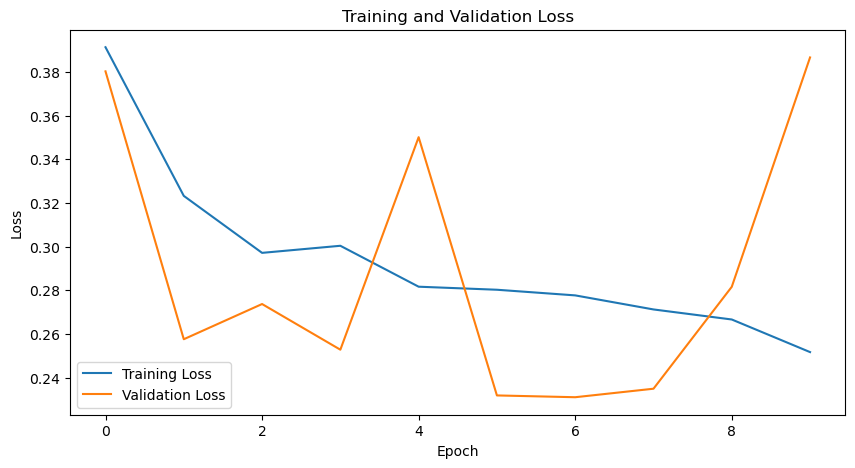

In [34]:
# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [35]:
# Step 3: Fine-tune the model
for param in trained_model.parameters():
    param.requires_grad = False
for param in trained_model.layer4.parameters():
    param.requires_grad = True

optimizer = optim.Adam(trained_model.parameters(), lr=0.0001)  # Lower learning rate for fine-tuning

In [36]:
trained_model, train_losses, val_losses = train_model(trained_model, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3)

Epoch 1/10: 100%|██████████| 227/227 [02:50<00:00,  1.33batch/s, loss=0.41]  


Epoch [1/10], Loss: 0.1970
Validation Loss: 0.3621


Epoch 2/10: 100%|██████████| 227/227 [02:55<00:00,  1.29batch/s, loss=0.0279] 


Epoch [2/10], Loss: 0.1084
Validation Loss: 0.2509


Epoch 3/10: 100%|██████████| 227/227 [03:04<00:00,  1.23batch/s, loss=0.092]  


Epoch [3/10], Loss: 0.0593
Validation Loss: 0.3569


Epoch 4/10: 100%|██████████| 227/227 [02:56<00:00,  1.29batch/s, loss=0.0132] 


Epoch [4/10], Loss: 0.0576
Validation Loss: 0.2583


Epoch 5/10: 100%|██████████| 227/227 [02:54<00:00,  1.30batch/s, loss=0.885]   


Epoch [5/10], Loss: 0.0353
Validation Loss: 0.3713
Early stopping


### Plot Loss

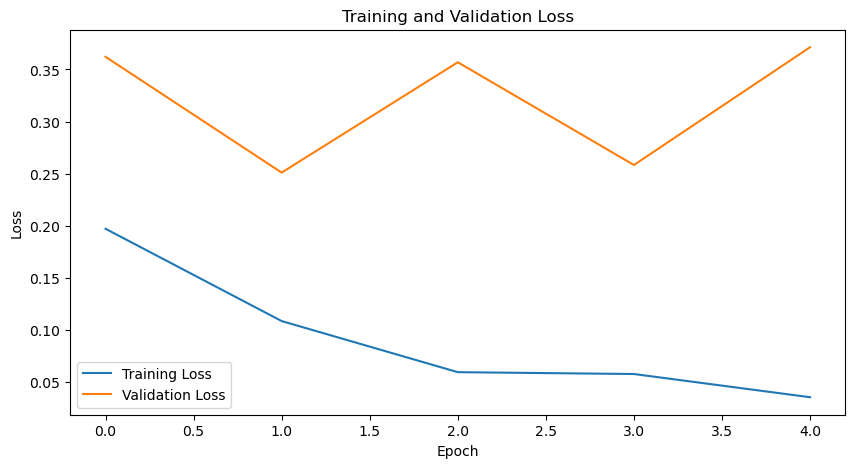

In [37]:
# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [38]:
test_images, test_labels, test_probs = evaluate_model_with_images(trained_model, test_loader, device=device)
val_images, val_labels, val_probs = evaluate_model_with_images(trained_model, val_loader, device=device)

Evaluating: 100%|██████████| 49/49 [00:32<00:00,  1.52batch/s]


In [39]:
# Calculate the best threshold
best_threshold, best_f1 = find_best_threshold(val_labels, val_probs)
print(f"Best Threshold: {best_threshold}")
# Generate final predictions based on optimal threshold
test_preds = [1 if prob >= best_threshold else 0 for prob in test_probs]

Best Threshold: 0.52


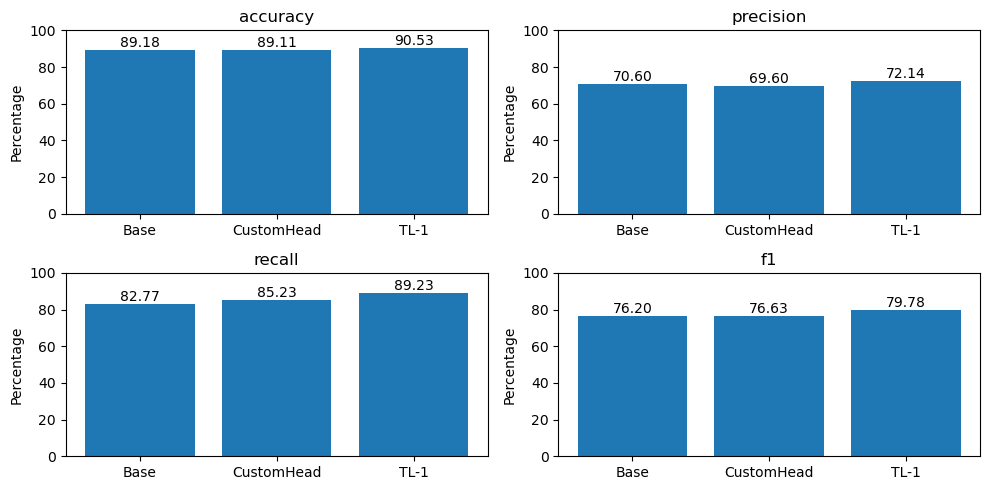

In [40]:
metrics.run(test_labels, test_preds, "TL-1")
metrics.plot()

In [41]:
# if not os.path.isdir('./models/TL-L4'):
#     os.makedirs('./models/TL-L4')
# # Save ResNet50 model weights
# torch.save(resnet50.state_dict(), 'models/TL-L4/resnet50_TL-L4.pth')

Last plotted image index: 9


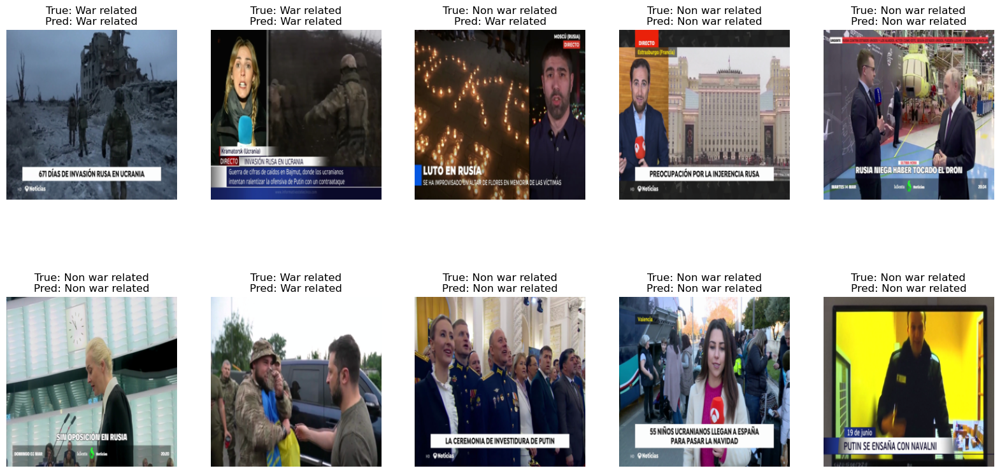

In [42]:
image_eval = EvaluateImages(test_images, test_labels, test_preds, test_probs)
image_eval.plot_images(0)

## UnFreezing 2 layers

In [43]:
# Step 3: Fine-tune the model
for param in trained_model.parameters():
    param.requires_grad = False
for param in trained_model.layer4.parameters():
    param.requires_grad = True
for param in trained_model.layer3.parameters():
    param.requires_grad = True

optimizer = optim.Adam(trained_model.parameters(), lr=0.00001)  # Lower learning rate for fine-tuning

In [44]:
# Train the model
trained_model, train_losses, val_losses = train_model(trained_model, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3)

Epoch 1/10: 100%|██████████| 227/227 [03:29<00:00,  1.09batch/s, loss=0.321]  


Epoch [1/10], Loss: 0.0550
Validation Loss: 0.2327


Epoch 2/10: 100%|██████████| 227/227 [03:32<00:00,  1.07batch/s, loss=0.134]  


Epoch [2/10], Loss: 0.0236
Validation Loss: 0.2439


Epoch 3/10: 100%|██████████| 227/227 [03:27<00:00,  1.09batch/s, loss=0.0475]  


Epoch [3/10], Loss: 0.0129
Validation Loss: 0.2478


Epoch 4/10: 100%|██████████| 227/227 [03:29<00:00,  1.09batch/s, loss=0.00162] 


Epoch [4/10], Loss: 0.0100
Validation Loss: 0.2680
Early stopping


### Plot Loss

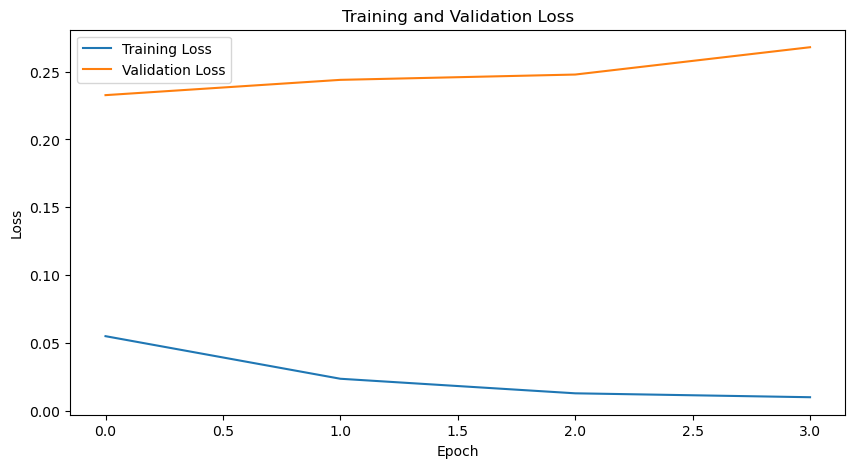

In [45]:
# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [46]:
test_images, test_labels, test_probs = evaluate_model_with_images(trained_model, test_loader, device=device)
val_images, val_labels, val_probs = evaluate_model_with_images(trained_model, val_loader, device=device)

Evaluating: 100%|██████████| 49/49 [00:32<00:00,  1.50batch/s]


In [47]:
# Calculate the best threshold
best_threshold, best_f1 = find_best_threshold(val_labels, val_probs)
print(f"Best Threshold: {best_threshold}")
# Generate final predictions based on optimal threshold
test_preds = [1 if prob >= best_threshold else 0 for prob in test_probs]

Best Threshold: 0.4


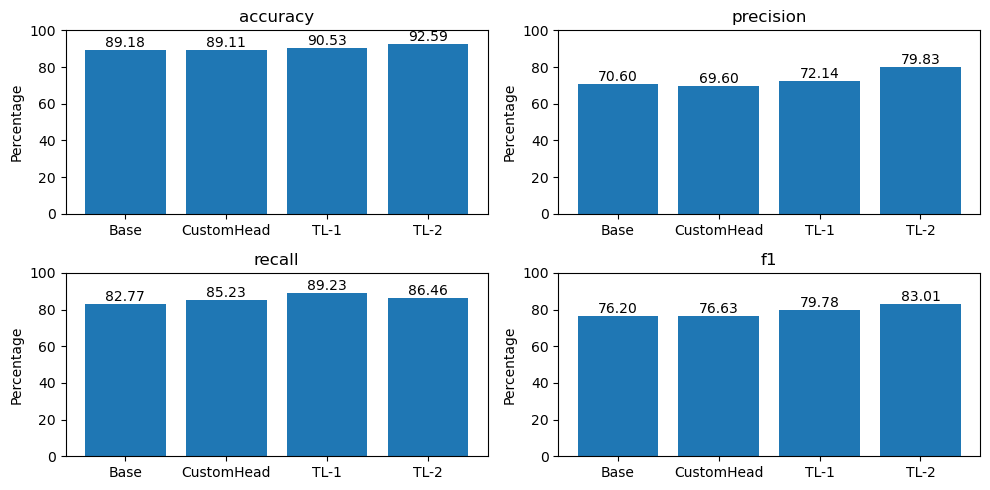

In [48]:
metrics.run(test_labels, test_preds, "TL-2")
metrics.plot()

In [49]:
if not os.path.isdir('./model_weights/TL-2'):
    os.makedirs('./model_weights/TL-2')
# Save ResNet50 model weights
torch.save(resnet50.state_dict(), 'model_weights/TL-2/resnet50_TL-2.pth')

Last plotted image index: 9


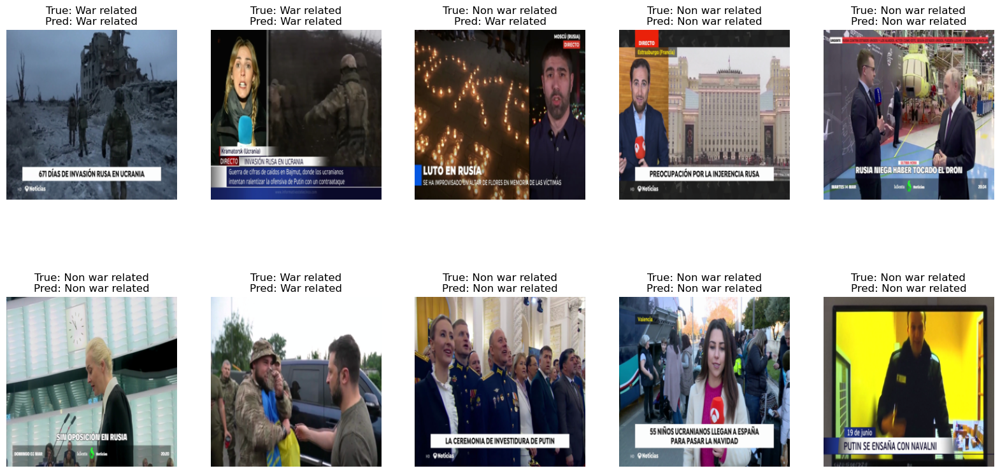

In [50]:
image_eval = EvaluateImages(test_images, test_labels, test_preds, test_probs)
image_eval.plot_images(0)

Last plotted image index: 9


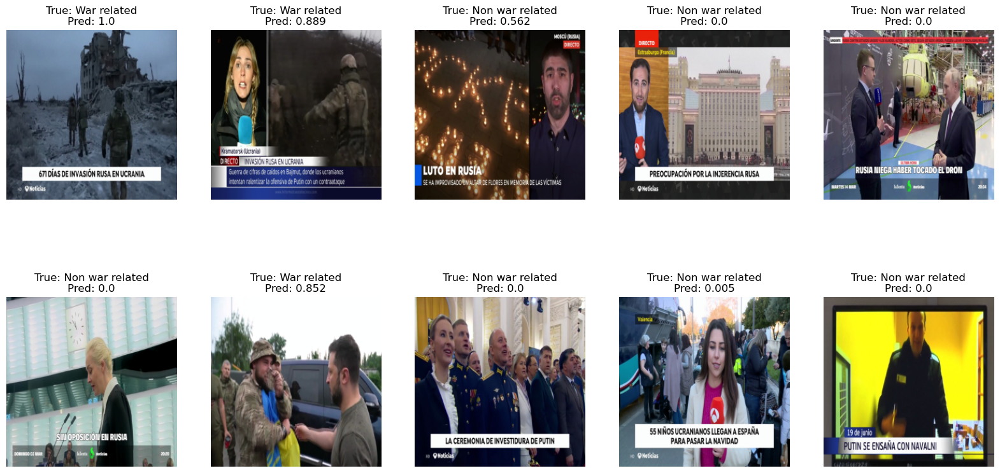

In [51]:
image_eval = EvaluateImages(test_images, test_labels, test_preds, test_probs)
image_eval.plot_images(0, probs=True)

## UnFreezing 3 layers

In [52]:
for param in trained_model.parameters():
    param.requires_grad = False
for param in trained_model.layer4.parameters():
    param.requires_grad = True
for param in trained_model.layer3.parameters():
    param.requires_grad = True
for param in trained_model.layer2.parameters():
    param.requires_grad = True

optimizer = optim.Adam(trained_model.parameters(), lr=0.00001)  # Lower learning rate for fine-tuning

In [53]:
# Train the model
trained_model, train_losses, val_losses = train_model(trained_model, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3)

Epoch 1/10: 100%|██████████| 227/227 [04:07<00:00,  1.09s/batch, loss=0.00222] 


Epoch [1/10], Loss: 0.0279
Validation Loss: 0.2420


Epoch 2/10: 100%|██████████| 227/227 [04:05<00:00,  1.08s/batch, loss=0.00774] 


Epoch [2/10], Loss: 0.0133
Validation Loss: 0.2567


Epoch 3/10: 100%|██████████| 227/227 [04:19<00:00,  1.14s/batch, loss=1.39]    


Epoch [3/10], Loss: 0.0095
Validation Loss: 0.2685


Epoch 4/10: 100%|██████████| 227/227 [04:16<00:00,  1.13s/batch, loss=1.07]    


Epoch [4/10], Loss: 0.0096
Validation Loss: 0.2923
Early stopping


### Plot Loss

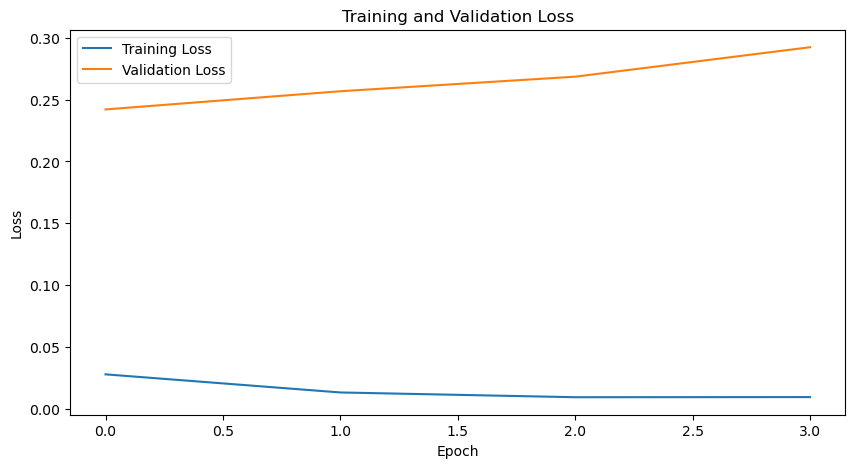

In [54]:
# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [55]:
test_images, test_labels, test_probs = evaluate_model_with_images(trained_model, test_loader, device=device)
val_images, val_labels, val_probs = evaluate_model_with_images(trained_model, val_loader, device=device)

Evaluating: 100%|██████████| 49/49 [00:33<00:00,  1.47batch/s]


In [56]:
# Calculate the best threshold
best_threshold, best_f1 = find_best_threshold(val_labels, val_probs)
print(f"Best Threshold: {best_threshold}")
# Generate final predictions based on optimal threshold
test_preds = [1 if prob >= best_threshold else 0 for prob in test_probs]

Best Threshold: 0.2


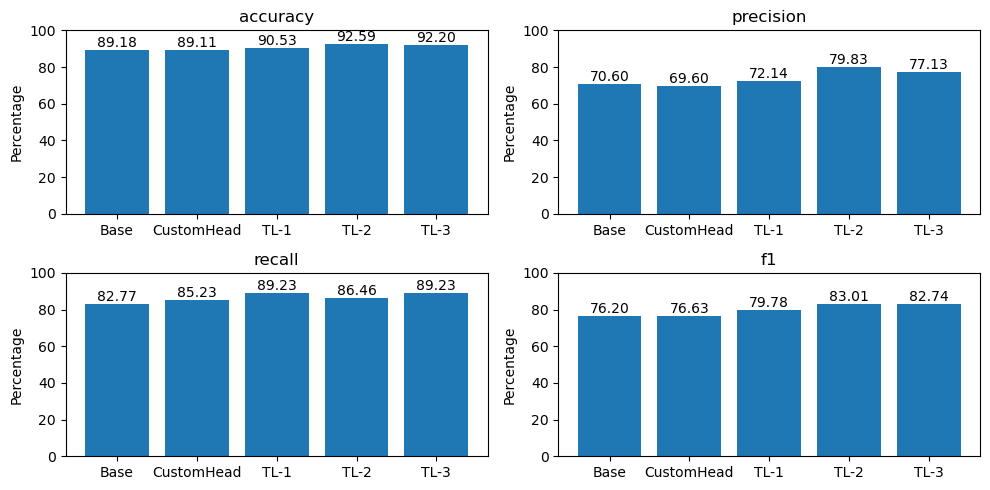

In [57]:
metrics.run(test_labels, test_preds, "TL-3")
metrics.plot()

In [58]:
if not os.path.isdir('./model_weights/TL-3'):
    os.makedirs('./model_weights/TL-3')
# Save ResNet50 model weights
torch.save(trained_model.state_dict(), 'model_weights/TL-3/resnet50_TL-3.pth')

Last plotted image index: 9


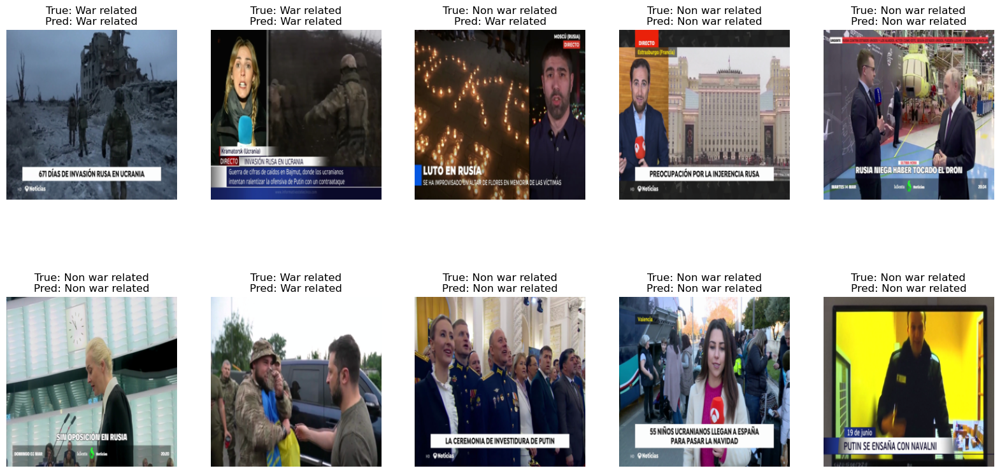

In [59]:
image_eval = EvaluateImages(test_images, test_labels, test_preds, test_probs)
image_eval.plot_images(0)

In [60]:
# Step 3: Fine-tune the model
for param in trained_model.parameters():
    param.requires_grad = True

optimizer = optim.Adam(trained_model.parameters(), lr=0.00001)  # Lower learning rate for fine-tuning

In [61]:
trained_model, train_losses, val_losses = train_model(trained_model, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3)

Epoch 1/10: 100%|██████████| 227/227 [04:41<00:00,  1.24s/batch, loss=0.542]   


Epoch [1/10], Loss: 0.0149
Validation Loss: 0.3083


Epoch 2/10: 100%|██████████| 227/227 [04:26<00:00,  1.17s/batch, loss=0.00285] 


Epoch [2/10], Loss: 0.0122
Validation Loss: 0.3082


Epoch 3/10: 100%|██████████| 227/227 [04:29<00:00,  1.19s/batch, loss=0.0497]  


Epoch [3/10], Loss: 0.0078
Validation Loss: 0.3371


Epoch 4/10: 100%|██████████| 227/227 [04:24<00:00,  1.16s/batch, loss=0.238]   


Epoch [4/10], Loss: 0.0043
Validation Loss: 0.4691


Epoch 5/10: 100%|██████████| 227/227 [04:27<00:00,  1.18s/batch, loss=3.62e-5] 


Epoch [5/10], Loss: 0.0081
Validation Loss: 0.3705
Early stopping


### Plot Loss

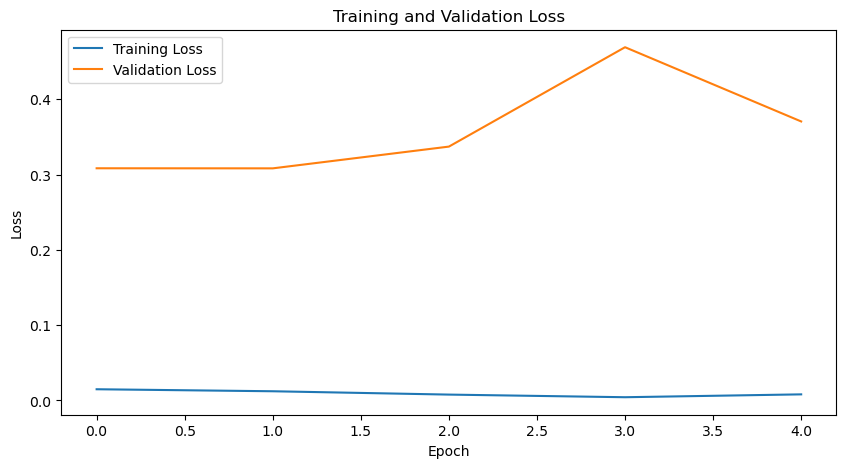

In [62]:
# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [63]:
test_images, test_labels, test_probs = evaluate_model_with_images(trained_model, test_loader, device=device)
val_images, val_labels, val_probs = evaluate_model_with_images(trained_model, val_loader, device=device)

Evaluating: 100%|██████████| 49/49 [00:36<00:00,  1.32batch/s]


In [67]:
# Calculate the best threshold
best_threshold, best_f1 = find_best_threshold(val_labels, val_probs)
print(f"Best Threshold: {best_threshold}")
# Generate final predictions based on optimal threshold
test_preds = [1 if prob >= 0.5 else 0 for prob in test_probs]

Best Threshold: 0.1


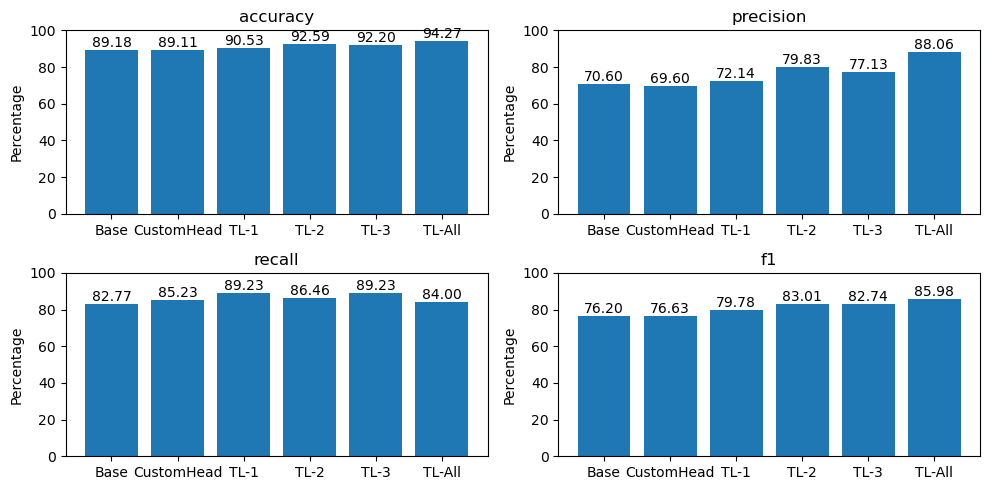

In [68]:
metrics.run(test_labels, test_preds, "TL-All")
metrics.plot()

In [66]:
if not os.path.isdir('./model_weights/TL-All'):
    os.makedirs('./model_weights/TL-All')
# Save ResNet50 model weights
torch.save(trained_model.state_dict(), 'model_weights/TL-All/resnet50_TL-All.pth')

Last plotted image index: 9


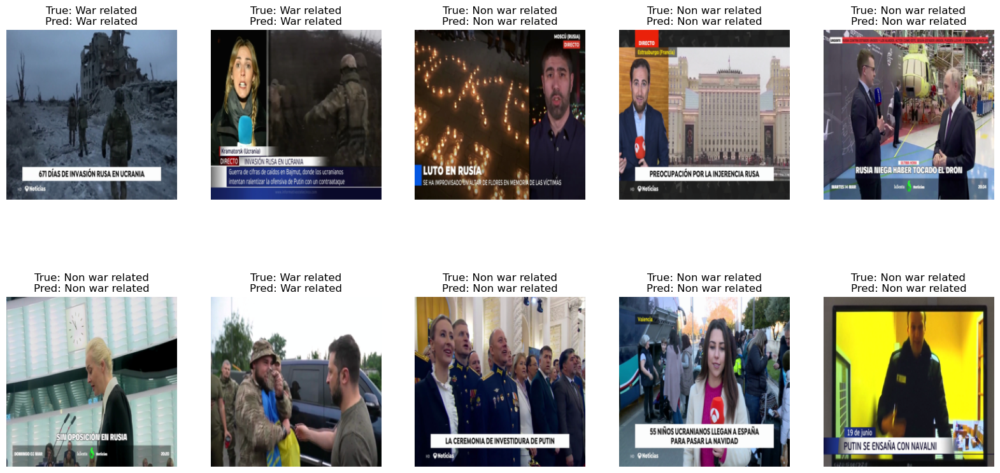

In [81]:
image_eval = EvaluateImages(test_images, test_labels, test_preds, test_probs)
image_eval.plot_images(0)

# Other Models

## EfficientNet

In [22]:
efficientnetb4 = torchvision.models.efficientnet_b4(weights=("pretrained", models.EfficientNet_B4_Weights.IMAGENET1K_V1))

# Freeze all the parameters
for param in efficientnetb4.parameters():
    param.requires_grad = False

# Change the final layer for binary classification
num_ftrs = efficientnetb4.classifier[1].in_features
efficientnetb4.classifier = torch.nn.Sequential(
            torch.nn.Linear(num_ftrs, 512),
            torch.nn.ReLU(),
            torch.nn.Dropout(0.5),
            torch.nn.Linear(512, 256),
            torch.nn.ReLU(),
            torch.nn.Dropout(0.5),
            torch.nn.Linear(256, 1)
        )

# Move the model to the GPU if available
device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
efficientnetb4 = efficientnetb4.to(device)

# Define the loss function and optimizer
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = optim.Adam(efficientnetb4.classifier.parameters(), lr=0.001)

print(efficientnetb4)

/Users/user/anaconda3/envs/torch-nightly/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B4_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B4_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
            (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(12, 48, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActiv

In [23]:
# Train the model
trained_model, train_losses, val_losses = train_model(efficientnetb4, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3)

Epoch 1/10: 100%|██████████| 114/114 [03:05<00:00,  1.63s/batch, loss=0.489]


Epoch [1/10], Loss: 0.3594
Validation Loss: 0.3433


Epoch 2/10: 100%|██████████| 114/114 [03:00<00:00,  1.58s/batch, loss=0.131]


Epoch [2/10], Loss: 0.2627
Validation Loss: 0.3166


Epoch 3/10: 100%|██████████| 114/114 [02:44<00:00,  1.45s/batch, loss=0.154]


Epoch [3/10], Loss: 0.2208
Validation Loss: 0.2894


Epoch 4/10: 100%|██████████| 114/114 [02:58<00:00,  1.56s/batch, loss=1.3]   


Epoch [4/10], Loss: 0.2035
Validation Loss: 0.3258


Epoch 5/10: 100%|██████████| 114/114 [02:52<00:00,  1.52s/batch, loss=1]     


Epoch [5/10], Loss: 0.1968
Validation Loss: 0.2873


Epoch 6/10:  52%|█████▏    | 59/114 [01:29<01:18,  1.43s/batch, loss=0.235] 

In [ ]:
test_images, test_labels, test_probs = evaluate_model_with_images(trained_model, test_loader, device=device)
val_images, val_labels, val_probs = evaluate_model_with_images(trained_model, val_loader, device=device)

# Calculate the best threshold
best_threshold, best_f1 = find_best_threshold(val_labels, val_probs)
print(f"Best Threshold: {best_threshold}")
# Generate final predictions based on optimal threshold
test_preds = [1 if prob >= best_threshold else 0 for prob in test_probs]

In [ ]:
metrics.run(test_labels, test_preds, "ENet-B4")
metrics.plot()

In [ ]:
if not os.path.isdir('./models/ENet-B4'):
    os.makedirs('./models/ENet-B4')
# Save ResNet50 model weights
torch.save(resnet50.state_dict(), 'models/ENet-B4/ENet-B4.pth')

In [ ]:
index=plot_test_images_with_labels(test_images, test_labels, test_preds, num_images=10, index=50, only_wrong=True)

## ResNet 101_32x8d

In [142]:
resnet101_32 = torchvision.models.resnext101_32x8d(weights=("pretrained", models.ResNeXt101_32X8D_Weights.IMAGENET1K_V1))

# Freeze all the parameters
for param in resnet101_32.parameters():
    param.requires_grad = False

# Replace the final fully connected layer
num_ftrs = resnet101_32.fc.in_features
# Define the custom head with two additional dense layers
resnet101_32.fc = torch.nn.Sequential(
    torch.nn.Linear(num_ftrs, 256),
    torch.nn.ReLU(),
    torch.nn.Linear(256, 128),
    torch.nn.ReLU(),
    torch.nn.Linear(128, 1)  # 2 output units for binary classification
)

# Move the model to the GPU if available
device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
resnet101_32 = resnet101_32.to(device)

# Define the loss function and optimizer
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = optim.Adam(resnet101_32.fc.parameters(), lr=0.001)

print(resnet101_32)

/Users/user/anaconda3/envs/torch-nightly/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt101_32X8D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt101_32X8D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

In [143]:
# Train the model
trained_model, train_losses, val_losses = train_model(resnet101_32, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3)

Epoch 1/10: 100%|██████████| 114/114 [06:56<00:00,  3.65s/batch, loss=0.397]


Epoch [1/10], Loss: 0.3650
Validation Loss: 0.2438


Epoch 2/10: 100%|██████████| 114/114 [07:13<00:00,  3.81s/batch, loss=0.199]


Epoch [2/10], Loss: 0.3071
Validation Loss: 0.2275


Epoch 3/10: 100%|██████████| 114/114 [06:56<00:00,  3.66s/batch, loss=0.0954]


Epoch [3/10], Loss: 0.2715
Validation Loss: 0.2995


Epoch 4/10: 100%|██████████| 114/114 [06:47<00:00,  3.57s/batch, loss=0.864]


Epoch [4/10], Loss: 0.2636
Validation Loss: 0.2942


Epoch 5/10: 100%|██████████| 114/114 [06:10<00:00,  3.25s/batch, loss=1.22] 


Epoch [5/10], Loss: 0.2478
Validation Loss: 0.4314
Early stopping


In [144]:
test_images, test_labels, test_probs = evaluate_model_with_images(trained_model, test_loader, device=device)
val_images, val_labels, val_probs = evaluate_model_with_images(trained_model, val_loader, device=device)

Evaluating: 100%|██████████| 25/25 [01:35<00:00,  3.81s/batch]


In [145]:
# Calculate the best threshold
best_threshold, best_f1 = find_best_threshold(val_labels, val_probs)
print(f"Best Threshold: {best_threshold}")
# Generate final predictions based on optimal threshold
test_preds = [1 if prob >= best_threshold else 0 for prob in test_probs]

Best Threshold: 0.64


In [ ]:
metrics = Metrics()

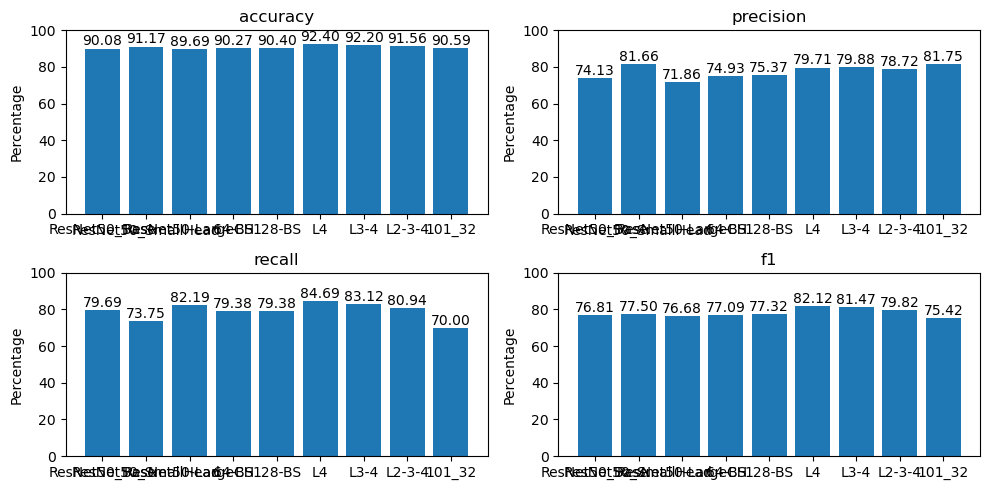

In [146]:
metrics.run(test_labels, test_preds, "101_32")
metrics.plot()

In [148]:
# Step 3: Fine-tune the model
for param in resnet101_32.parameters():
    param.requires_grad = False
for param in resnet101_32.layer4.parameters():
    param.requires_grad = True
# for param in resnet101_32.layer3.parameters():
#     param.requires_grad = True

optimizer = optim.Adam(resnet101_32.parameters(), lr=0.0001)  # Lower learning rate for fine-tuning

In [149]:
# Train the model
trained_model, train_losses, val_losses = train_model(resnet101_32, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3)

Epoch 1/10: 100%|██████████| 114/114 [1:24:17<00:00, 44.36s/batch, loss=2.17]  


Epoch [1/10], Loss: 0.1863
Validation Loss: 0.2548


Epoch 2/10: 100%|██████████| 114/114 [1:21:44<00:00, 43.02s/batch, loss=0.192]  


Epoch [2/10], Loss: 0.1109
Validation Loss: 0.2381


Epoch 3/10: 100%|██████████| 114/114 [1:36:23<00:00, 50.73s/batch, loss=0.000892]


Epoch [3/10], Loss: 0.0645
Validation Loss: 0.2094


Epoch 4/10: 100%|██████████| 114/114 [1:40:41<00:00, 53.00s/batch, loss=2.35]   


Epoch [4/10], Loss: 0.0377
Validation Loss: 0.2602


Epoch 5/10:  22%|██▏       | 25/114 [24:26<1:19:55, 53.88s/batch, loss=0.0203]

In [ ]:
test_images, test_labels, test_probs = evaluate_model_with_images(trained_model, test_loader, device=device)
val_images, val_labels, val_probs = evaluate_model_with_images(trained_model, val_loader, device=device)

# Calculate the best threshold
best_threshold, best_f1 = find_best_threshold(val_labels, val_probs)
print(f"Best Threshold: {best_threshold}")
# Generate final predictions based on optimal threshold
test_preds = [1 if prob >= best_threshold else 0 for prob in test_probs]

metrics.run(test_labels, test_preds, "101FT")
metrics.plot()

## ResNet 152

In [ ]:
resnet152 = torchvision.models.resnet152(weights=("pretrained", models.ResNet152_Weights.IMAGENET1K_V1))

# Freeze all the parameters
for param in resnet152.parameters():
    param.requires_grad = False

# Replace the final fully connected layer
num_ftrs = resnet152.fc.in_features
# Define the custom head with two additional dense layers
resnet152.fc = torch.nn.Sequential(
    torch.nn.Linear(num_ftrs, 256),
    torch.nn.ReLU(),
    torch.nn.Linear(256, 128),
    torch.nn.ReLU(),
    torch.nn.Linear(128, 1)  # 2 output units for binary classification
)

# Move the model to the GPU if available
device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
resnet152 = resnet152.to(device)

# Define the loss function and optimizer
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = optim.Adam(resnet152.fc.parameters(), lr=0.001)

print(resnet152)

In [ ]:
# Train the model
trained_model, train_losses, val_losses = train_model(resnet152, train_loader, val_loader, criterion, optimizer, num_epochs=10, patience=3)

In [ ]:
test_images, test_labels, test_probs = evaluate_model_with_images(trained_model, test_loader, device=device)
val_images, val_labels, val_probs = evaluate_model_with_images(trained_model, val_loader, device=device)

In [ ]:
# Calculate the best threshold
best_threshold, best_f1 = find_best_threshold(val_labels, val_probs)
print(f"Best Threshold: {best_threshold}")
# Generate final predictions based on optimal threshold
test_preds = [1 if prob >= best_threshold else 0 for prob in test_probs]

metrics.run(test_labels, test_preds, "152")
metrics.plot()